In [1]:
%matplotlib inline

import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import xarray as xr
import cmocean.cm as cmocean
import glob
import matplotlib.path as mpath
import matplotlib.colors as col
from netCDF4 import Dataset
from mpl_toolkits.axes_grid1 import make_axes_locatable


import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client

figdir = '/g/data/e14/pc5520/figures/basal_melt_param/'

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/44741/status,
Dashboard: /proxy/44741/status,Workers: 6
Total threads: 24,Total memory: 128.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38851,Workers: 6
Dashboard: /proxy/44741/status,Total threads: 24
Started: Just now,Total memory: 128.00 GiB
Comm: tcp://127.0.0.1:42703,Total threads: 4
Dashboard: /proxy/45299/status,Memory: 21.33 GiB
Nanny: tcp://127.0.0.1:46105,


In [3]:
session_name = '/g/data/v45/wf4500/databases/gdata_01deg_jra55v13_ryf9091_DSW.db'
master_session = cc.database.create_session(session_name)
control = '01deg_jra55v13_ryf9091_DSW'

In [4]:
basal_gade_woa = '01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb'

icb_gade_woa = '01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb'

icb_gade_woa_mwp = '01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb_mwp'

basal_nogade_woa = '01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb'

basal_nogade_woa_bottom = '01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb_bottom'

control_mwp = '01deg_jra55v13_ryf9091_DSW_control_mwp'

icb_gade_woa_freez_surf = '01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb_freez_surf'

basal_gade_woa_fra = 'accessom2-GPC038'

icb_gade_woa_fra = 'accessom2-GPC039'

start_time='1900-01-01'
end_time='1901-01-01'

lat_slice  = slice(-80,-59)

depthlim = 1500

In [5]:
# build database for these experiments:
session_name = '/g/data/ik11/databases/basal_melt_MOM5.db'
basal_melt_session = cc.database.create_session(session_name)

dir_list = ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb_freez_surf',
           '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_control_mwp',
           '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb/',
           '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb/',
           '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb_mwp/',
           '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb',
           '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb_bottom',
           '/g/data/ik11/outputs/access-om2-01/basal_melt_outputs/accessom2-GPC038',
           '/g/data/ik11/outputs/access-om2-01/basal_melt_outputs/accessom2-GPC039']

cc.database.build_index(dir_list,basal_melt_session)

Indexing experiment: 01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb_freez_surf


0it [00:00, ?it/s]


Indexing experiment: 01deg_jra55v13_ryf9091_DSW_control_mwp


0it [00:00, ?it/s]


Indexing experiment: 01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb


0it [00:00, ?it/s]


Indexing experiment: 01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb


0it [00:00, ?it/s]


Indexing experiment: 01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb_mwp


0it [00:00, ?it/s]


Indexing experiment: 01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb


0it [00:00, ?it/s]


Indexing experiment: 01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb_bottom


0it [00:00, ?it/s]


Indexing experiment: accessom2-GPC038


0it [00:00, ?it/s]


Indexing experiment: accessom2-GPC039


0it [00:00, ?it/s]


0

In [6]:
# topography data for plotting:
ht = cc.querying.getvar(control,'ht' , master_session,n=1).sel(yt_ocean=lat_slice)
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

fontsize=15

In [ ]:
# First plot map of bottom temperature to see where we want to plot transects

In [ ]:
start_time='1909-01-01'
end_time='1910-01-01'

salt_con = cc.querying.getvar(control, 'salt', master_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_con = salt_con.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)
salt_con = salt_con.mean('time')

salt_basal_gade = cc.querying.getvar(basal_gade_woa, 'salt', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_basal_gade = salt_basal_gade.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)
salt_basal_gade = salt_basal_gade.mean('time')

In [ ]:
# select out bottom values:
depth_array = salt_con * 0 + salt_con.st_ocean
max_depth = depth_array.max(dim = 'st_ocean', skipna= True)

bottom_salt_con = salt_con.where(depth_array.st_ocean >= max_depth)
bottom_salt_con = bottom_salt_con.sum(dim = 'st_ocean')
bottom_salt_con = bottom_salt_con.load()

bottom_salt_basal_gade = salt_basal_gade.where(depth_array.st_ocean >= max_depth)
bottom_salt_basal_gade = bottom_salt_basal_gade.sum(dim = 'st_ocean')
bottom_salt_basal_gade = bottom_salt_basal_gade.load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.04/lib/python3.9/site-packages/dask/array/reductions.py:608: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.04/lib/python3.9/site-packages/dask/array/reductions.py:608: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.04/lib/python3.9/site-packages/dask/array/reductions.py:608: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.04/lib/python3.9/site-packages/dask/array/reductions.py:608: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.04/lib/python3.9/site-packages/dask/array/reductions.py:608: RuntimeWarning: All-NaN slice 

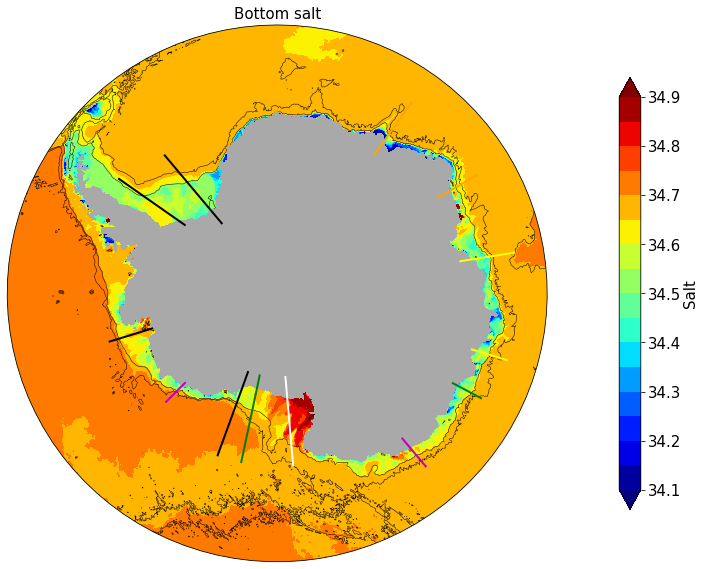

In [12]:
fig  = plt.figure(1, figsize = (25,12))
norm = col.Normalize(vmin=34.1,vmax=34.9)
levels=np.arange(34.1,34.905,.05)
ticks = [34.3,34.4,34.5,34.6,34.7,34.8]

# up:
# setup stereo projection:
ax = fig.add_axes([0.31, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
# plot:
cf = ax.contourf(bottom_salt_con.xt_ocean, bottom_salt_con.yt_ocean, bottom_salt_basal_gade, norm = norm, levels=levels,
                   cmap = cmocean.cm.jet, extend='both',transform = ccrs.PlateCarree())
ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
plt.title('Bottom salt',fontsize=fontsize)
ax.contourf(ht.xt_ocean, land_mask_lat,land_mask_masked,colors='darkgrey',
             zorder=2,transform = ccrs.PlateCarree())

# Add transect lines:

#Ross1
plt.plot([-185,-185],[-80,-70],'white',linewidth=2,transform = ccrs.PlateCarree())
#Ross2
plt.plot([-168,-168],[-80,-70],'green',linewidth=2,transform = ccrs.PlateCarree())
#Ross3
plt.plot([-160,-160],[-80,-70],'k',linewidth=2,transform = ccrs.PlateCarree())
#WedellW
plt.plot([-55,-55],[-77,-68],'k',linewidth=2,transform = ccrs.PlateCarree())
#WedellE
plt.plot([-40,-40],[-80,-70],'k',linewidth=2,transform = ccrs.PlateCarree())
# AmundsenE:
plt.plot([-107,-107],[-75,-70],'k',linewidth=2,transform = ccrs.PlateCarree())
# AmundsenW:
plt.plot([-135,-135],[-75,-72],'m',linewidth=2,transform = ccrs.PlateCarree())
# warm patch just downstream of Mertz:
plt.plot([-220,-220],[-68,-64],'m',linewidth=2,transform = ccrs.PlateCarree())
# cooling in Totten:
plt.plot([-242,-242],[-67.5,-64],'green',linewidth=2,transform = ccrs.PlateCarree())
# cold patch in Vincennes Bay:
plt.plot([-253,-253],[-67,-63],'yellow',linewidth=2,transform = ccrs.PlateCarree())
# Inter I:
plt.plot([-279,-279],[-69,-63],'yellow',linewidth=2,transform = ccrs.PlateCarree())
# warm patch downstream of PrydzE:
plt.plot([60,60],[-69,-64],'orange',linewidth=2,transform = ccrs.PlateCarree())
# warm patch downstream of PrydzW:
plt.plot([35.5,35.5],[-71,-64],'orange',linewidth=2,transform = ccrs.PlateCarree())
        
ax.set_extent([-180, 180, -90, -59.5], ccrs.PlateCarree())

# colorbar:
cbaxes = fig.add_axes([0.65, 0.25, 0.012, 0.5])
cbar = plt.colorbar(cf, cax = cbaxes, orientation = 'vertical',extend = 'both')
cbar.set_label(r'Salt',fontsize=fontsize,labelpad=2)
cbar.ax.tick_params(labelsize=fontsize)

#figure_path = figdir+'map_bottom_salt_with_transect_locations.png'
#plt.savefig(figure_path, dpi=120,bbox_inches='tight', pad_inches=0.1,facecolor='white')

In [11]:
#Temperature transects

In [7]:
zlevel1 = 0
zlevel2 = depthlim + 100

def get_transect_extra_data(lon,lat1,lat2,extrasim,month1,month2,year1,year2):
    lat_slice  = slice(lat1, lat2)
    
    first_year = str(year1)
    last_year = str(year2)
    
    start_time=first_year+'-'+f'{month1:02}'+'-01'
    end_time=last_year+'-'+f'{month2:02}'+'-01'

    # import bathymetry:
    ht_transect = cc.querying.getvar(control,'ht',master_session,n=1)
    ht_transect = ht_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice)
    ht_transect = ht_transect.load()
    ht_transect[np.isnan(ht_transect)] = 0
    
    temp_extra_transect = cc.querying.getvar(extrasim, 'temp', basal_melt_session,frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
    temp_extra_transect = temp_extra_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    temp_extra_transect = temp_extra_transect.load()
    
    salt_extra_transect = cc.querying.getvar(extrasim, 'salt', basal_melt_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    salt_extra_transect = salt_extra_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    salt_extra_transect = salt_extra_transect.load()
    
    age_extra_transect = cc.querying.getvar(extrasim, 'age_global', basal_melt_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    age_extra_transect = age_extra_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    age_extra_transect = age_extra_transect.load()
    
    v_extra_transect = cc.querying.getvar(extrasim, 'v', basal_melt_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    v_extra_transect = v_extra_transect.sel(xu_ocean=lon,method='nearest').sel(yu_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    v_extra_transect = v_extra_transect.load()
    
    rho0_extra = cc.querying.getvar(extrasim, 'pot_rho_0', basal_melt_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    rho0_extra = rho0_extra.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    rho0_extra = rho0_extra.load()
    
    #Import basal melt
    #basal_basal_gade = cc.querying.getvar(extrasim, 'basal_fwflx', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
    #basal_basal_gade = basal_basal_gade.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    #basal_basal_gade = basal_basal_gade.load()
    
    return ht_transect,temp_extra_transect,salt_extra_transect,age_extra_transect,v_extra_transect,rho0_extra

In [8]:
zlevel1 = 0
zlevel2 = depthlim + 100

def get_transect_data(lon,lat1,lat2,month1,month2,year1,year2):
    lat_slice  = slice(lat1, lat2) 
    
    first_year = str(year1)
    last_year = str(year2)

    start_time=first_year+'-'+f'{month1:02}'+'-01'
    end_time=last_year+'-'+f'{month2:02}'+'-01'

    # import bathymetry:
    ht_transect = cc.querying.getvar(control,'ht',master_session,n=1)
    ht_transect = ht_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice)
    ht_transect = ht_transect.load()
    ht_transect[np.isnan(ht_transect)] = 0

    ### load data for this period:
    temp_con_transect = cc.querying.getvar(control,'temp' , master_session,frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
    temp_con_transect = temp_con_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    temp_con_transect = temp_con_transect.load()

    ### load data for this period:
    salt_con_transect = cc.querying.getvar(control,'salt' , master_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    salt_con_transect = salt_con_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    salt_con_transect = salt_con_transect.load()
    
    ### load data for this period:
    age_con_transect = cc.querying.getvar(control,'age_global' , master_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    age_con_transect = age_con_transect.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    age_con_transect = age_con_transect.load()

    ### load data for this period:
    v_con_transect = cc.querying.getvar(control,'v' , master_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    v_con_transect = v_con_transect.sel(xu_ocean=lon,method='nearest').sel(yu_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    v_con_transect = v_con_transect.load()
    
    ### also get density for plotting isopycnals:
    rho0_con = cc.querying.getvar(control,'pot_rho_0' , master_session,frequency='1 monthly',start_time=start_time, end_time=end_time)
    rho0_con = rho0_con.sel(xt_ocean=lon,method='nearest').sel(yt_ocean=lat_slice).sel(time=slice(start_time,end_time)).sel(st_ocean=slice(zlevel1,zlevel2)).mean('time')
    rho0_con = rho0_con.load()
    
    return ht_transect,temp_con_transect,salt_con_transect,age_con_transect,v_con_transect,rho0_con


In [9]:
def plot_transects(region,config,config2, month1,month2,year1,year2):

    if region == 'AmundsenW':
        lon = -135
        lat1 = -74.7
        lat2 = -73
    elif region == 'AmundsenWE':
        lon = -115
        lat1 = -75
        lat2 = -70
    elif region == 'AmundsenE':
        lon = -107
        lat1 = -75
        lat2 = -70
    elif region == 'Belling1':
        lon = -85
        lat1 = -75
        lat2 = -67
    elif region == 'Belling2':
        lon = -90
        lat1 = -75
        lat2 = -67
    elif region == 'Belling3':
        lon = -95
        lat1 = -75
        lat2 = -67
    elif region == 'Mertz':
        lon = -220
        lat1 = -66.8
        lat2 = -64.5
    elif region == 'Totten':
        lon = -242
        lat1 = -67.2
        lat2 = -64
    elif region == 'Vincennes':
        lon = -253
        lat1 = -67
        lat2 = -63
    elif region == 'Interm':
        lon = -279
        lat1 = -69
        lat2 = -63
    elif region == 'PrydzE':
        lon = 60
        lat1 = -67.5
        lat2 = -64    
    elif region == 'PrydzW':
        lon = 35.5
        lat1 = -69.5
        lat2 = -66 
    elif region == 'WedellW':
        lon = -55
        lat1 = -77
        lat2 = -68
    elif region == 'WedellE':
        lon = -40
        lat1 = -80
        lat2 = -70
    elif region == 'Ross1':
        lon = -185
        lat1 = -80
        lat2 = -70
    elif region == 'Ross2':
        lon = -168
        lat1 = -80
        lat2 = -70
    elif region == 'Ross3':
        lon = -160
        lat1 = -80
        lat2 = -70

    ht_transect,temp_con_transect,salt_con_transect,age_con_transect,v_con_transect,rho0_con = get_transect_data(lon,lat1,lat2+.1,month1,month2,year1,year2)
    
    extrasim = config #basal
    ht_transect2,temp_extra_transect,salt_extra_transect,age_extra_transect,v_extra_transect,rho0_extra = get_transect_extra_data(lon,lat1,lat2+.1,extrasim,month1,month2,year1,year2)
    
    extrasim2 = config2 #icb
    ht_transect3,temp_extra_transect2,salt_extra_transect2,age_extra_transect2,v_extra_transect2,rho0_extra2 = get_transect_extra_data(lon,lat1,lat2+.1,extrasim2,month1,month2,year1,year2)
    

    ####
    
    
    ylimit = depthlim
    
    fontsize=16

    fig=plt.figure(figsize=(20,32))

    scale_max = 0.4

    density_contours = [1025,1026,1026.5,1027.0,1027.2,1027.5,1027.6,1027.72,1027.78,1027.81,1027.83,1027.835,1027.84,1027.845,1027.85,1027.86,1027.88,1027.90,1027.92,1028.0,1028.1,1028.2,1028.3,1029,1030]
    
    #####################################################################################################

    #### Control ####
    plt.subplot(4,3,1)
    norm = col.Normalize(vmin=-2.5,vmax=2)
    levels=np.arange(-2.5,2.05,.05)
    ticks = [-2.5,-2,-1,0,1,2]

    pcm = plt.contourf(temp_con_transect.yt_ocean,temp_con_transect.st_ocean,
                       temp_con_transect.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate'),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(temp_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    
    plt.title('Control',fontsize=fontsize)


    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Temperature ($^\circ$C)',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)
    
    #### Basal Gade - con ####
    plt.subplot(4,3,2)
    #norm = col.Normalize(vmin=-3,vmax=2)
    #levels=np.arange(-3,2.05,.05)
    #ticks = [-3,-2,-1,0,1,2]

    pcm = plt.contourf(temp_con_transect.yt_ocean,temp_con_transect.st_ocean,
                       temp_extra_transect.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate'),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(temp_extra_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    
    plt.title(str(extrasim),fontsize=fontsize)


    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Temperature($^\circ$C)',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)


    #### icb - con ####
    plt.subplot(4,3,3)
    #norm = col.Normalize(vmin=-3,vmax=2)
    #levels=np.arange(-3,2.05,.05)
    #ticks = [-3,-2,-1,0,1,2]
    
    pcm = plt.contourf(temp_con_transect.yt_ocean,temp_con_transect.st_ocean,
                       (temp_extra_transect2.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate')),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(temp_extra_transect2.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra2,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)

    #plt.title(region+', longitude='+str(lon),fontsize=fontsize)
    plt.title(str(extrasim2),fontsize=fontsize)
    
    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Temperature ($^\circ$C)',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)
    
    #####################################################################################################
    
    #### Control salt:
    plt.subplot(4,3,4)
    norm = col.Normalize(vmin=33,vmax=35)
    levels=np.arange(33,35,.1)
    ticks = [33,33.5,34,34.5,35]

    pcm = plt.contourf(salt_con_transect.yt_ocean,salt_con_transect.st_ocean,
                       salt_con_transect.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate'),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    plt.title('Control',fontsize=fontsize)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Salt',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)
    
    #### Basal diff:
    plt.subplot(4,3,5)
    norm = col.Normalize(vmin=33,vmax=35)
    levels=np.arange(33,35,.1)
    ticks = [33,33.5,34,34.5,35]

    pcm = plt.contourf(salt_con_transect.yt_ocean,salt_con_transect.st_ocean,
                       (salt_extra_transect.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate')),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    plt.title(str(extrasim),fontsize=fontsize)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Salt',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)


    #### ICB diff:
    plt.subplot(4,3,6)
    norm = col.Normalize(vmin=33,vmax=35)
    levels=np.arange(33,35,.1)
    ticks = [33,33.5,34,34.5,35]
    
    pcm = plt.contourf(salt_con_transect.yt_ocean,salt_con_transect.st_ocean,
                       (salt_extra_transect2.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate')),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra2,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    
    plt.title(str(extrasim2),fontsize=fontsize)


    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Salt',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)
    
    #####################################################################################################
    
    #### Control age:
    plt.subplot(4,3,7)
    yy = 2
    norm = col.Normalize(vmin=0,vmax=yy)
    levels=np.arange(0,yy,yy/10)
    ticks = [0,0.25*yy,0.5*yy,0.75*yy,yy]

    pcm = plt.contourf(age_con_transect.yt_ocean,age_con_transect.st_ocean,
                       age_con_transect.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate'),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    plt.title('Control',fontsize=fontsize)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Age (yr)',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)
    
    #### Basal_Gade diff:
    plt.subplot(4,3,8)
    #norm = col.Normalize(vmin=0,vmax=2)
    #levels=np.arange(0,2,.1)
    #ticks = [0,0.5,1,1.5,2]

    pcm = plt.contourf(age_con_transect.yt_ocean,age_con_transect.st_ocean,
                       (age_extra_transect.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate')),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    plt.title(str(extrasim),fontsize=fontsize)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Age (yr)',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)


    #### Basal_gade age:
    plt.subplot(4,3,9)
    #norm = col.Normalize(vmin=0,vmax=2)
    #levels=np.arange(0,2,.1)
    #ticks = [0,0.5,1,1.5,2]
    pcm = plt.contourf(age_con_transect.yt_ocean,age_con_transect.st_ocean,
                       (age_extra_transect2.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate')),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra2,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    
    plt.title(str(extrasim2),fontsize=fontsize)
    # basal
    #cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,basal_Tfreezing_min,
    #                  colors='pink',zorder=2 ,linewidths=10)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Age (yr)',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)
    
    #####################################################################################################
    
    #### Control rho:
    plt.subplot(4,3,10)
    norm = col.Normalize(vmin=1027,vmax=1028)
    levels=np.arange(1027,1028,0.01)
    ticks = [1027,1027.25,1027.5,1027.75,1028]

    pcm = plt.contourf(rho0_con.yt_ocean,rho0_con.st_ocean,
                       rho0_con.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate'),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'Control rho',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)
    
    #### Basal Gade diff:
    plt.subplot(4,3,11)
    norm = col.Normalize(vmin=1027,vmax=1028)
    levels=np.arange(1027,1028,0.01)
    ticks = [1027,1027.25,1027.5,1027.75,1028]

    pcm = plt.contourf(rho0_con.yt_ocean,rho0_con.st_ocean,
                       (rho0_extra.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate')),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.ylabel('Depth (m)',fontsize=fontsize)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'rho',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)


    #### Tfreezing_min age anomaly:
    plt.subplot(4,3,12)
    norm = col.Normalize(vmin=1027,vmax=1028)
    levels=np.arange(1027,1028,0.01)
    ticks = [1027,1027.25,1027.5,1027.75,1028]
    pcm = plt.contourf(rho0_con.yt_ocean,rho0_con.st_ocean,
                       (rho0_extra2.interpolate_na(dim='st_ocean',method='nearest',fill_value='extrapolate')),
                       cmap = cmocean.cm.jet, norm = norm,levels=levels,extend='both')
    plt.fill_between(salt_con_transect.yt_ocean,ht_transect,ylimit,zorder=3,color='darkgrey')
    plt.ylim(ylimit,0)
    plt.xlim(lat1,lat2)
    plt.xlabel('Latitude',fontsize=fontsize)
    plt.tick_params(labelsize=fontsize)

    # isopycnals:
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_extra2,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize,linestyles='--')
    cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,rho0_con,density_contours,
                      colors='k',zorder=2 ,fontsize=fontsize)
    # basal
    #cont=plt.contour(rho0_con.yt_ocean,rho0_con.st_ocean,basal_Tfreezing_min,
    #                  colors='pink',zorder=2 ,linewidths=10)

    # colorbar:
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="4%", pad=0.8)
    cbar = plt.colorbar(pcm, cax=cax,orientation = 'horizontal',extend = 'neither',ticks=ticks)
    cbar.set_label(r'rho',fontsize=fontsize,labelpad=5)
    cbar.ax.tick_params(labelsize=fontsize)


In [14]:
m1,m2=3,4
y1,y2=1903,1903
sim1=icb_gade_woa
sim2=icb_gade_woa_fra

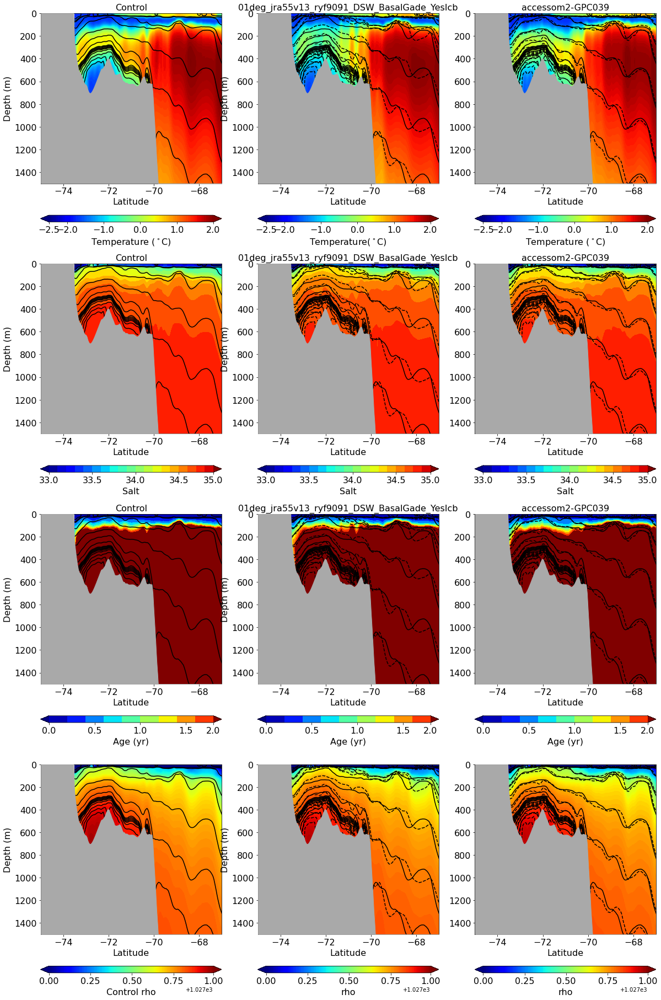

In [13]:
plot_transects('Belling1',sim1,sim2,m1,m2,y1,y2)

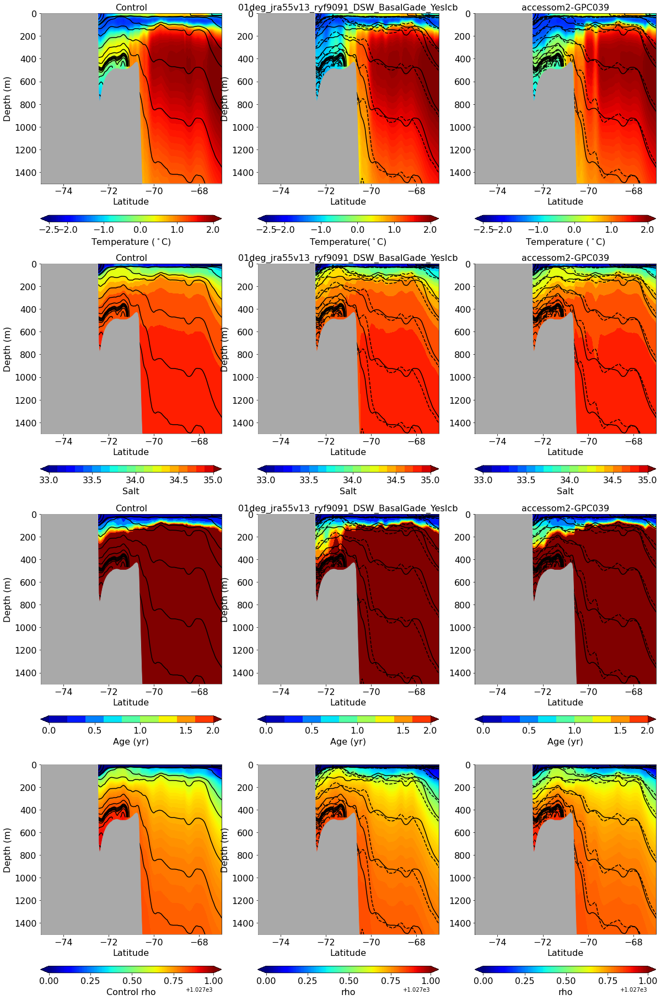

In [14]:
plot_transects('Belling2',sim1,sim2,m1,m2,y1,y2)

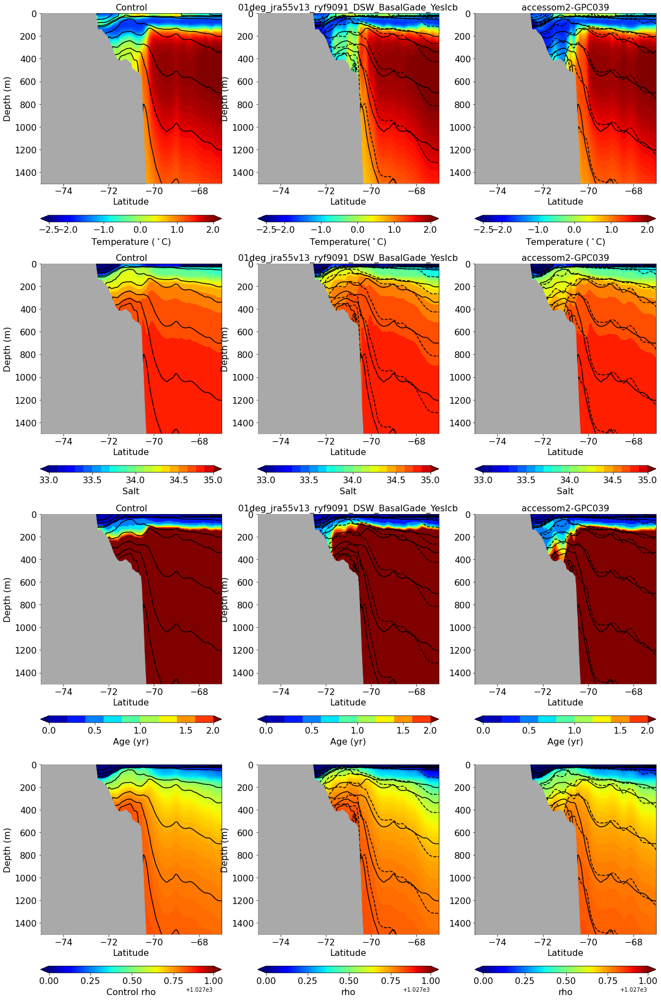

In [15]:
plot_transects('Belling3',sim1,sim2,m1,m2,y1,y2)

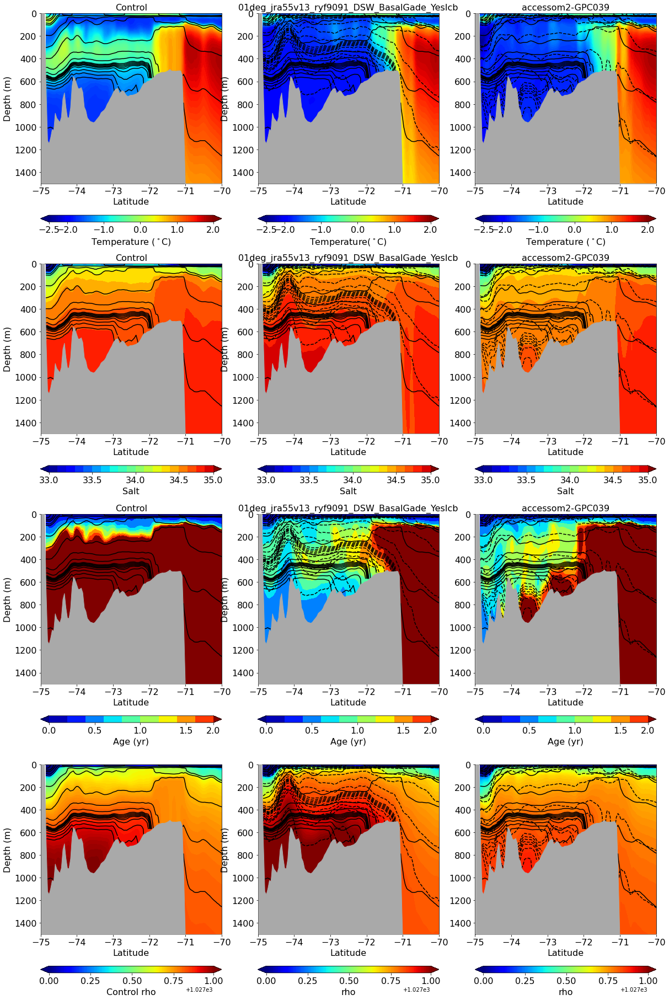

In [16]:
plot_transects('AmundsenE',sim1,sim2,m1,m2,y1,y2)

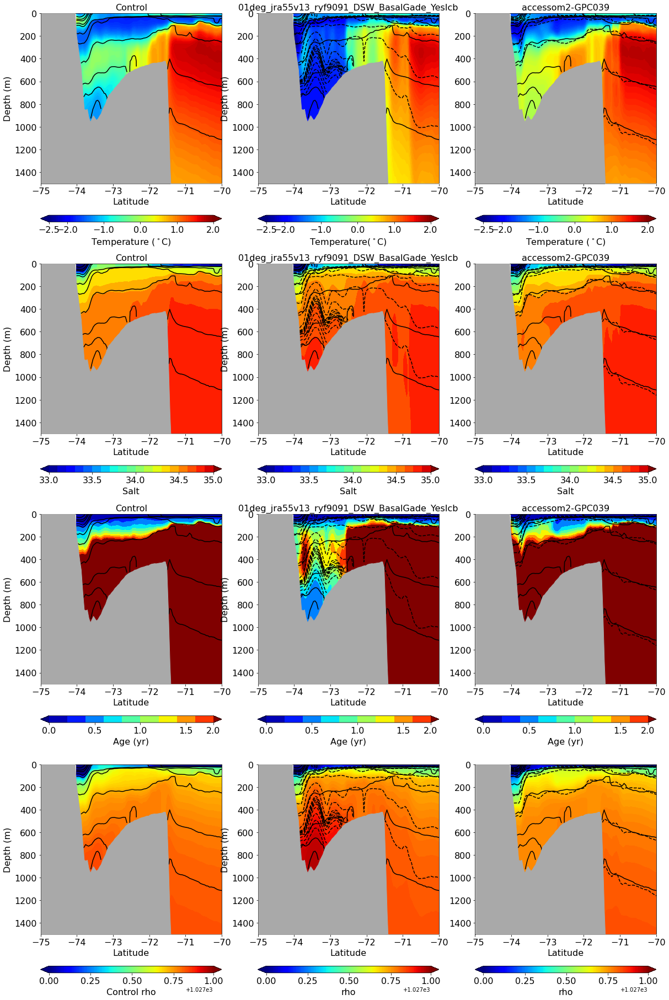

In [17]:
plot_transects('AmundsenWE',sim1,sim2,m1,m2,y1,y2)

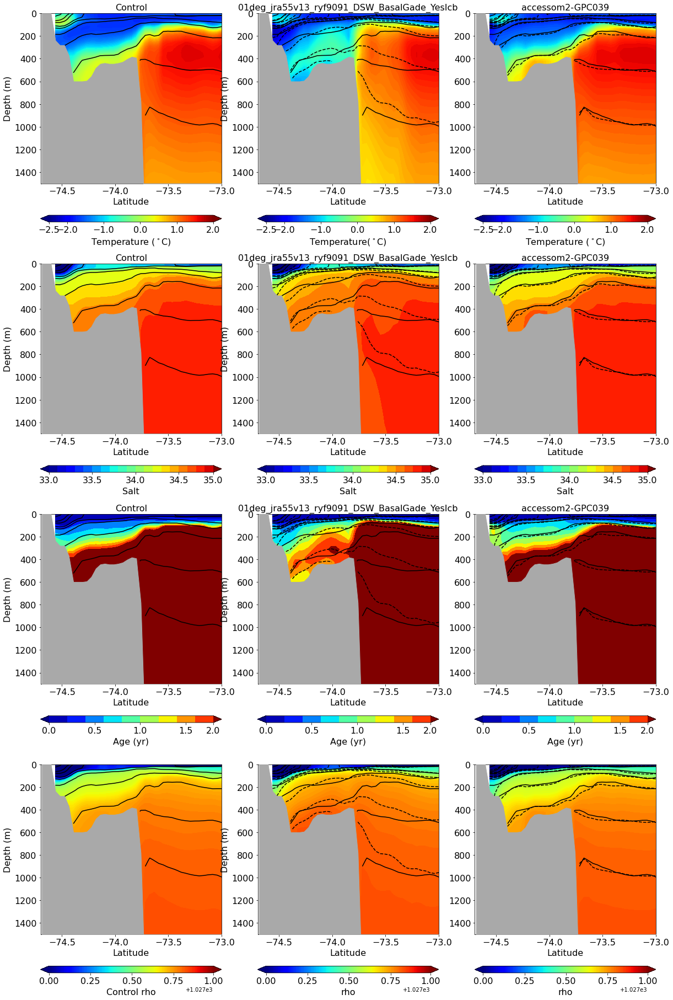

In [18]:
plot_transects('AmundsenW',sim1,sim2,m1,m2,y1,y2)

2024-03-21 07:19:45,648 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
2024-03-21 07:19:46,711 - distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
2024-03-21 07:19:47,880 - distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
2024-03-21 07:19:49,848 - distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
2024-03-21 07:19:51,644 - distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
2024-03-21 07:19:53,038 - distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


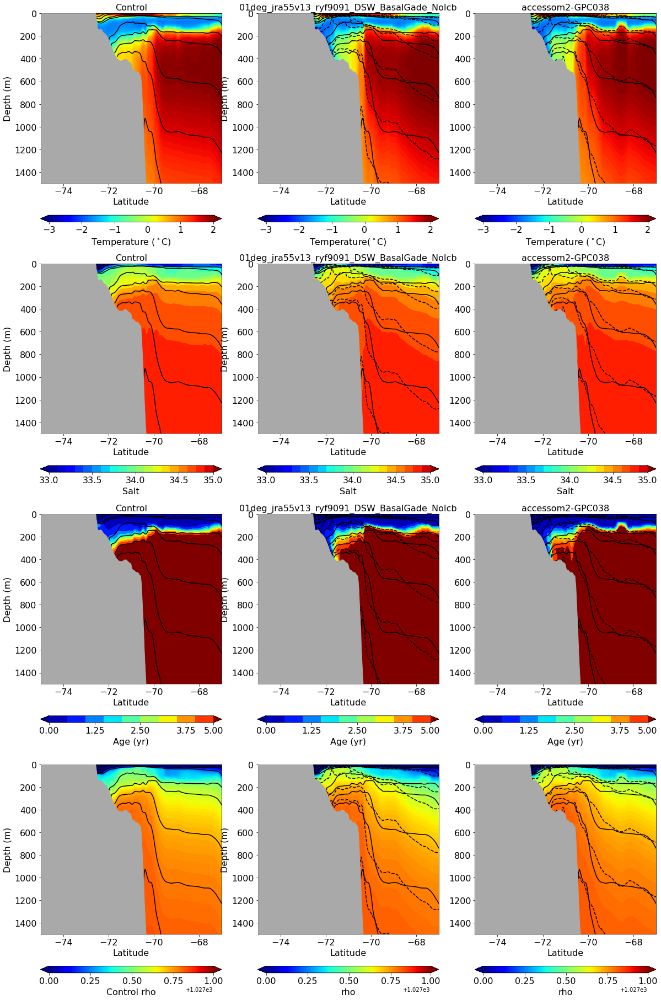

In [19]:
plot_transects('Belling3',sim1,sim2,1,2,1906,1906)

2024-03-21 07:19:56,059 - distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
2024-03-21 07:19:57,486 - distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
2024-03-21 07:19:59,279 - distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
2024-03-21 07:20:00,877 - distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
2024-03-21 07:20:02,244 - distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
2024-03-21 07:20:03,295 - distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)


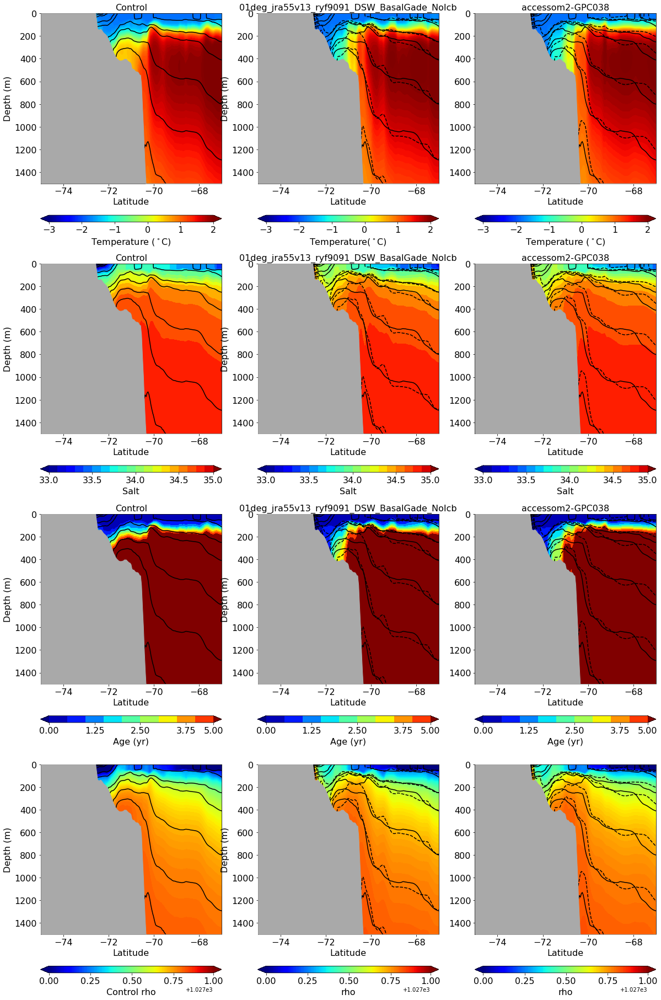

In [20]:
plot_transects('Belling3',sim1,sim2,6,7,1906,1906)

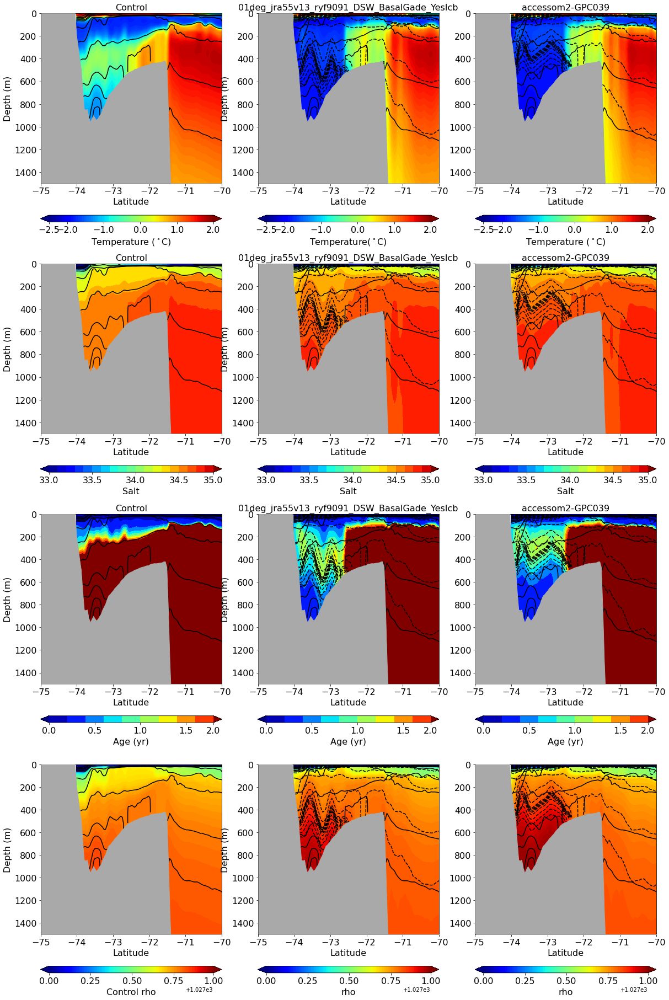

In [15]:
plot_transects('AmundsenWE',sim1,sim2,1,2,1903,1903)

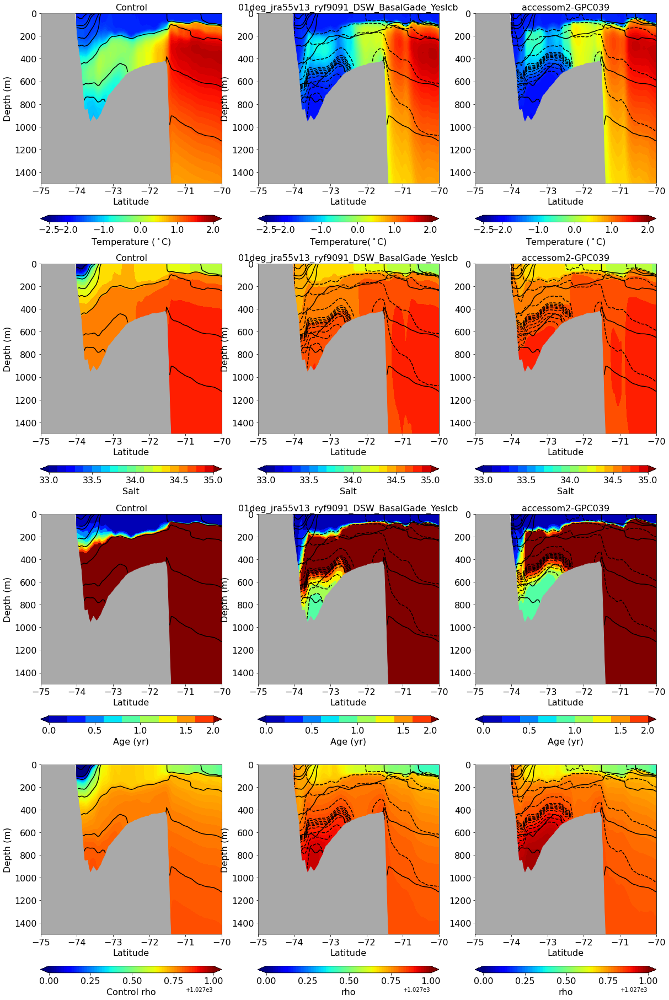

In [16]:
plot_transects('AmundsenWE',sim1,sim2,7,8,1903,1903)

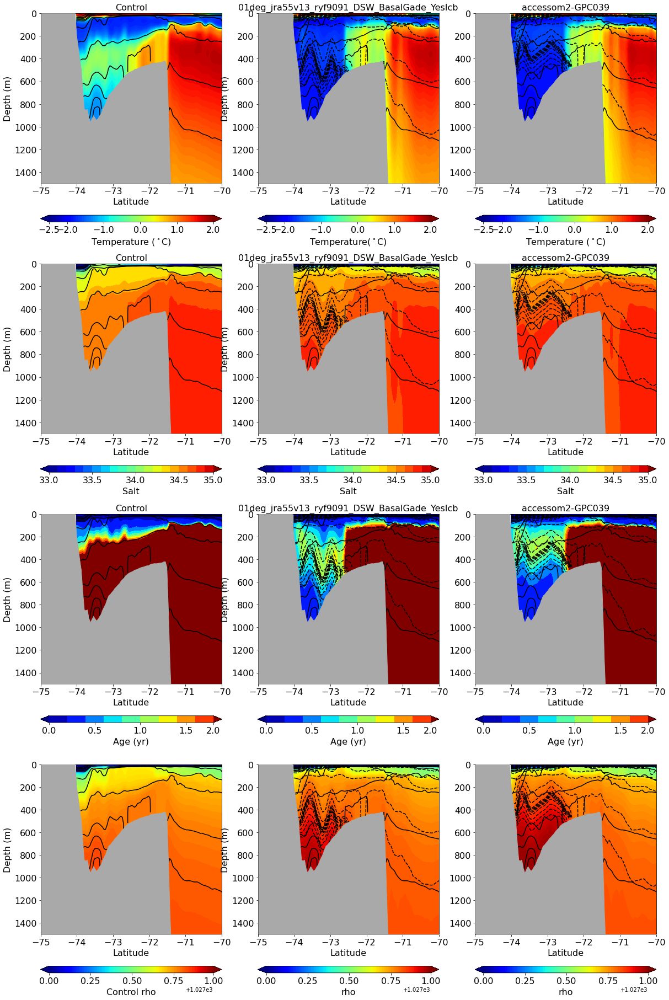

In [17]:
plot_transects('AmundsenWE',sim1,sim2,1,2,1903,1903)

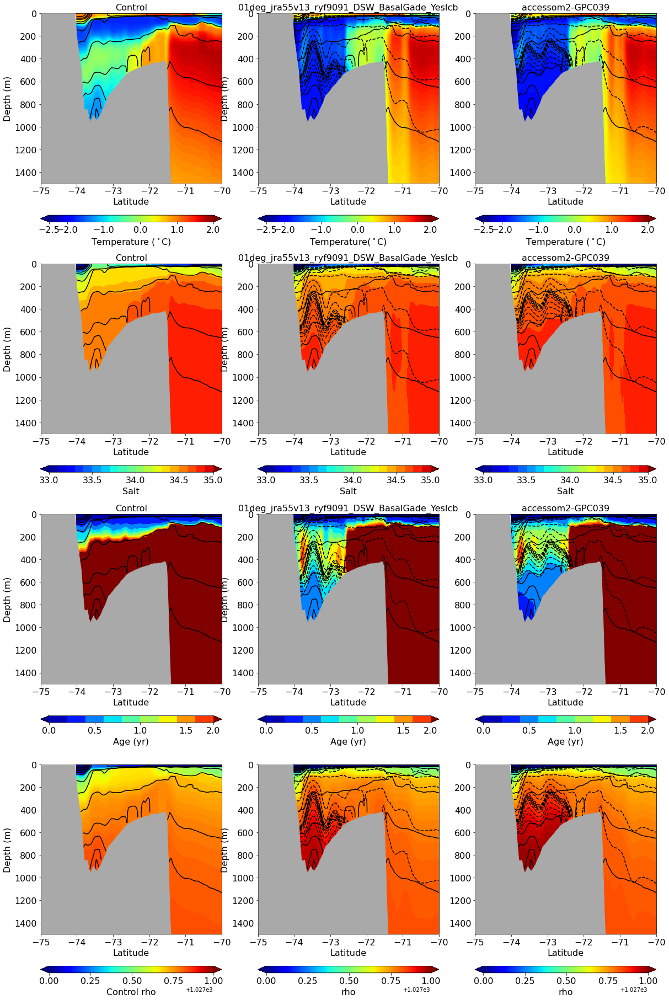

In [18]:
plot_transects('AmundsenWE',sim1,sim2,2,3,1903,1903)

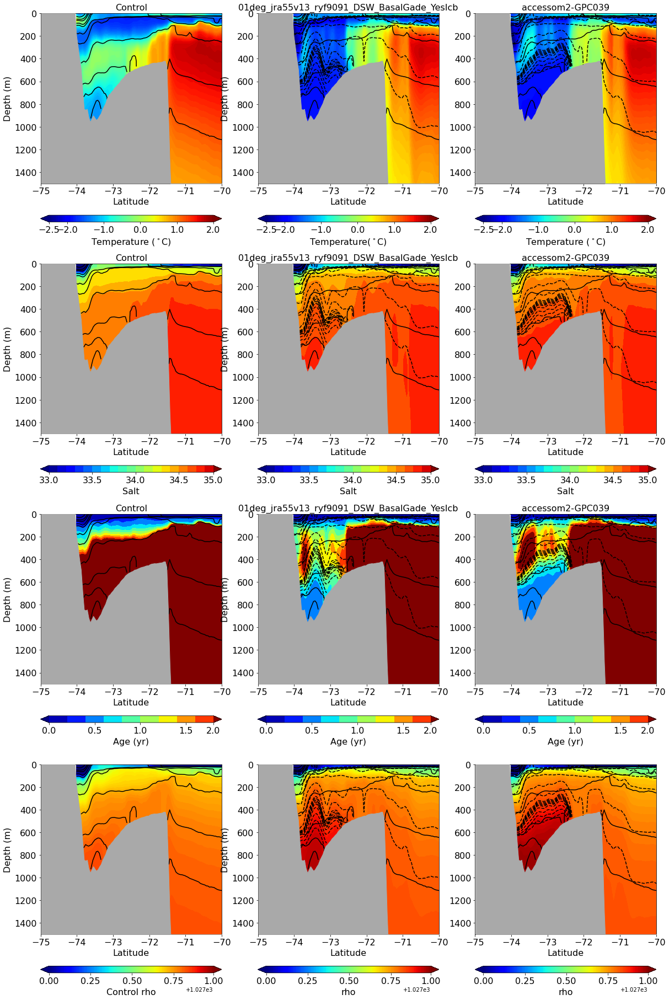

In [19]:
plot_transects('AmundsenWE',sim1,sim2,3,4,1903,1903)

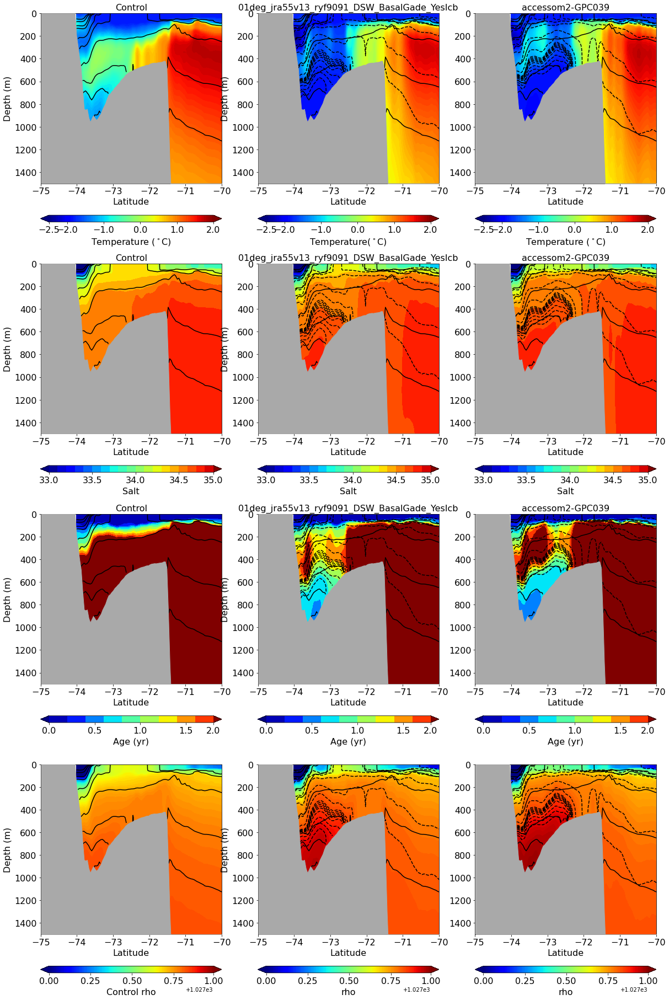

In [20]:
plot_transects('AmundsenWE',sim1,sim2,4,5,1903,1903)

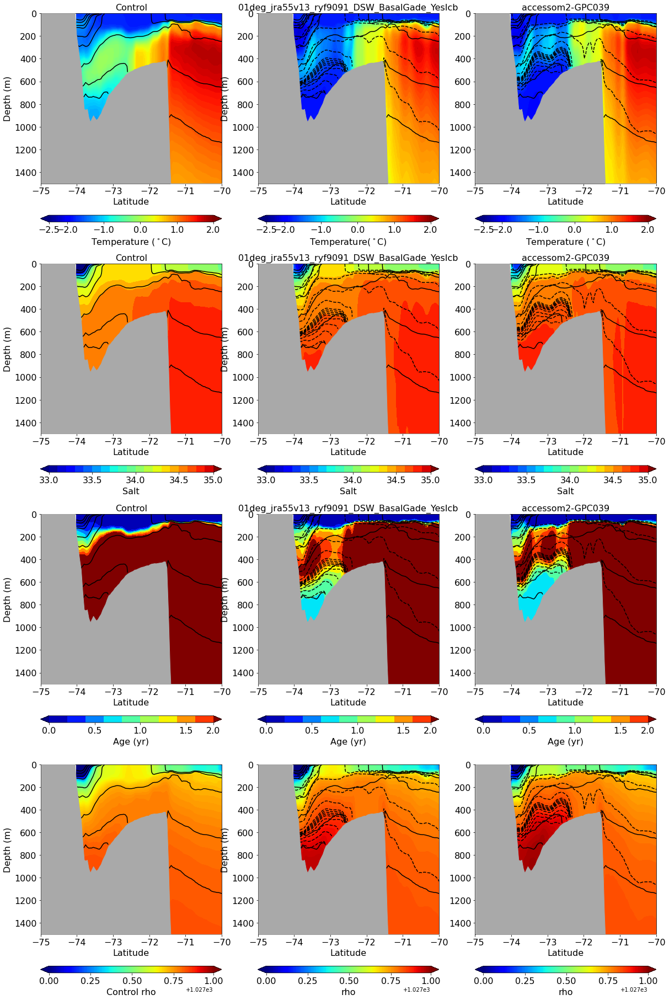

In [21]:
plot_transects('AmundsenWE',sim1,sim2,5,6,1903,1903)

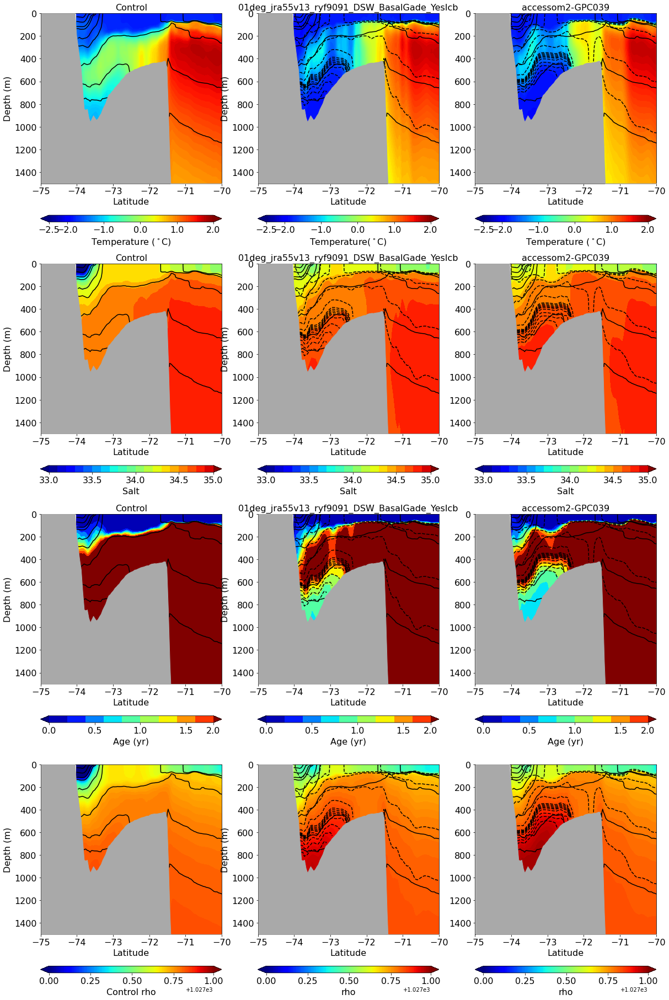

In [22]:
plot_transects('AmundsenWE',sim1,sim2,6,7,1903,1903)

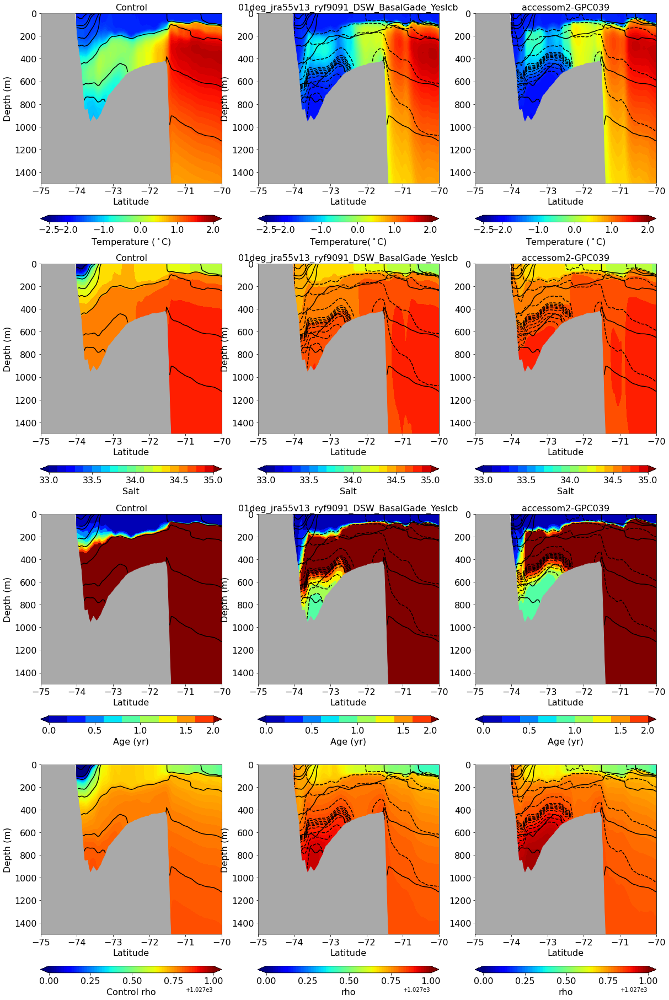

In [23]:
plot_transects('AmundsenWE',sim1,sim2,7,8,1903,1903)

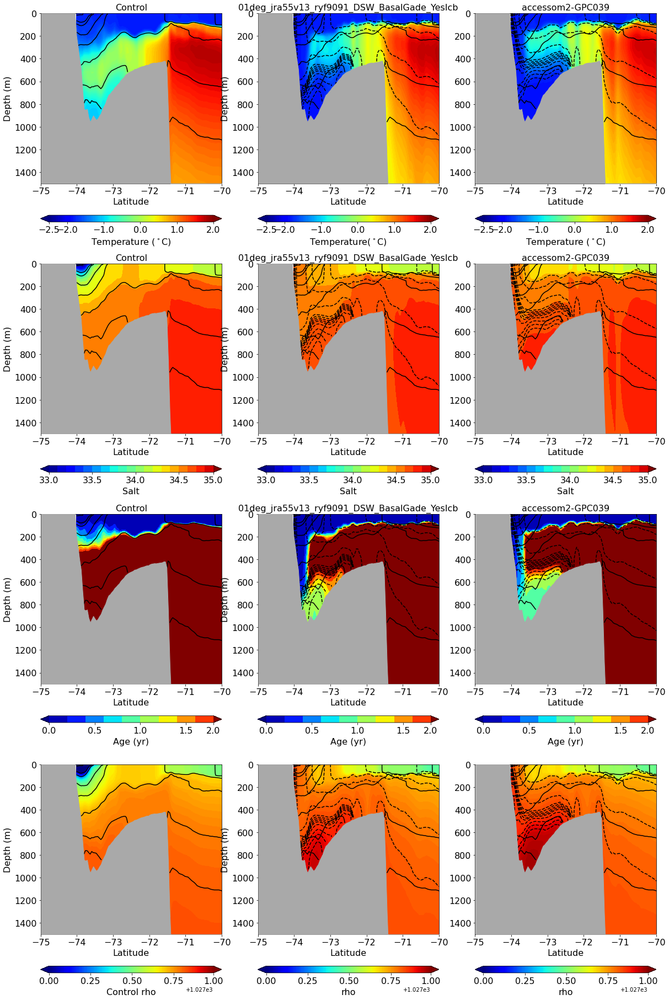

In [24]:
plot_transects('AmundsenWE',sim1,sim2,8,9,1903,1903)

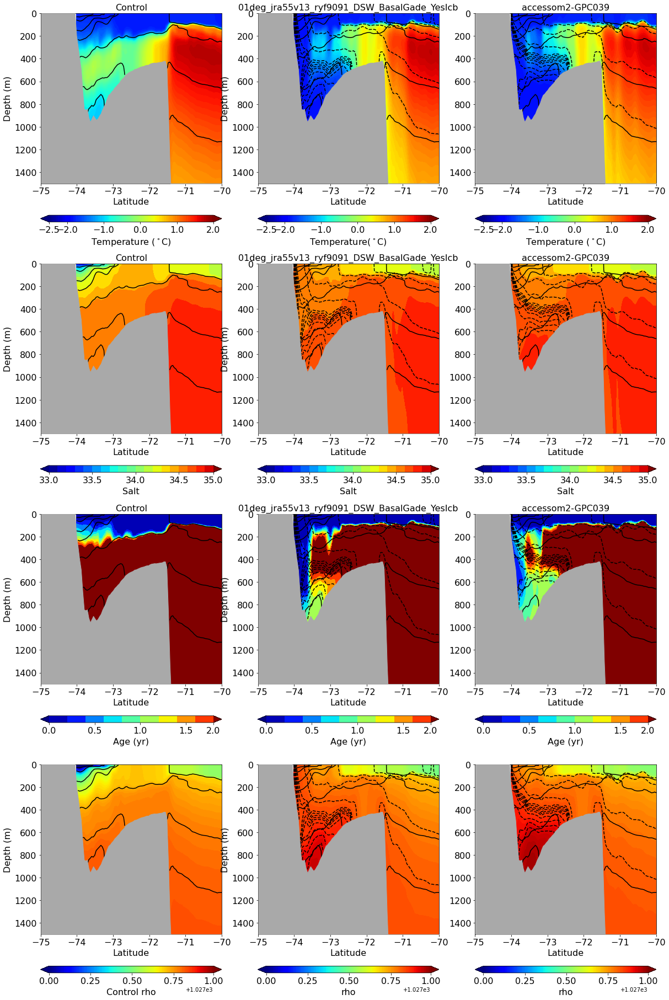

In [25]:
plot_transects('AmundsenWE',sim1,sim2,9,10,1903,1903)

2024-03-27 13:19:59,113 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-03-27 13:19:59,809 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


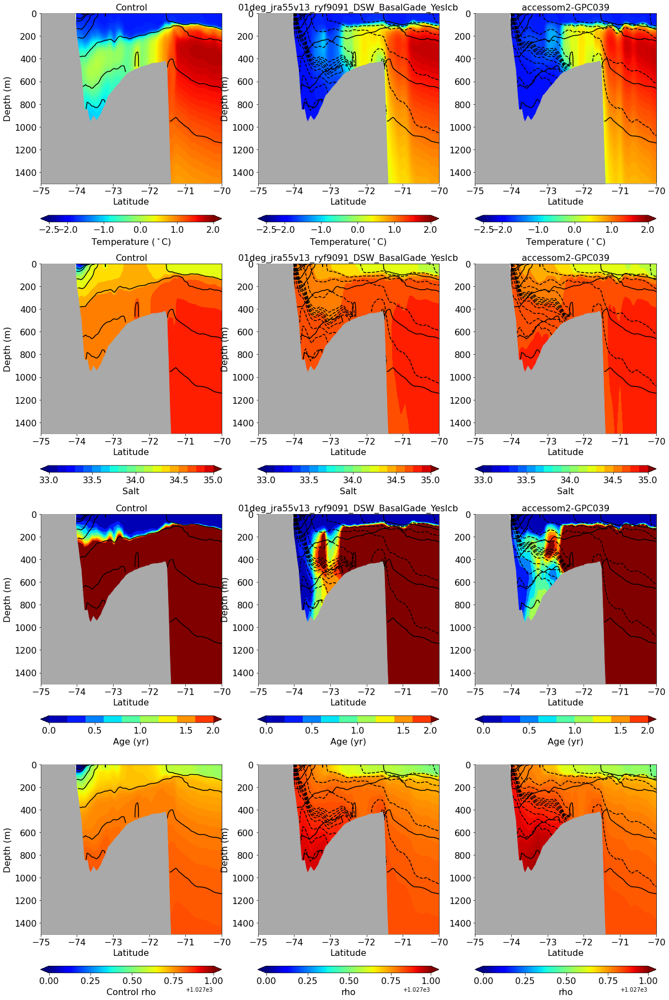

In [26]:
plot_transects('AmundsenWE',sim1,sim2,10,11,1903,1903)

2024-03-27 13:20:03,310 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


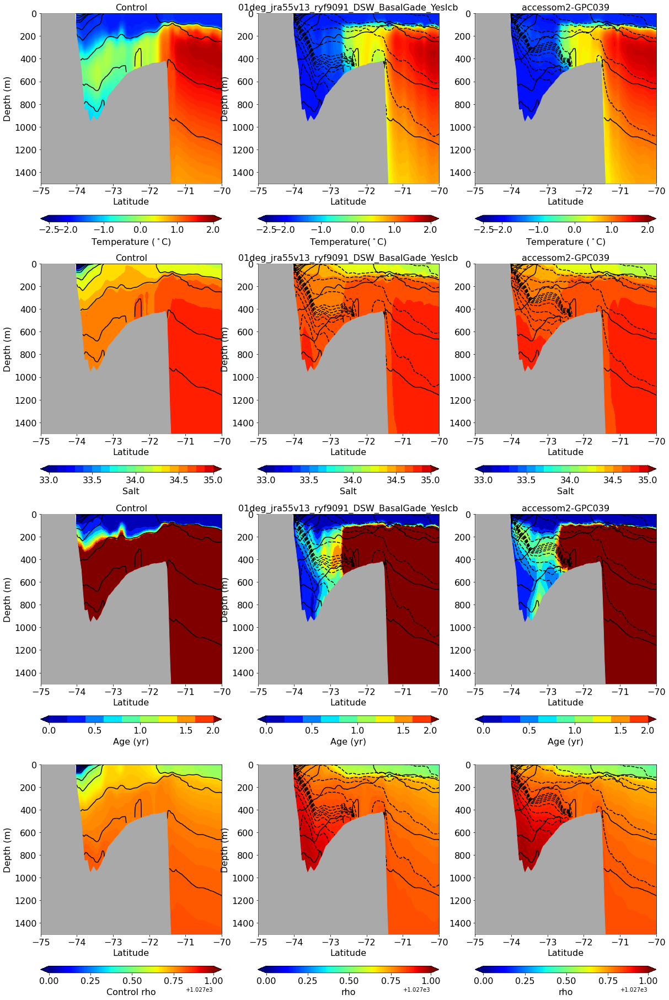

In [27]:
plot_transects('AmundsenWE',sim1,sim2,11,12,1903,1903)